# Characteristic Words Analysis: Gender and Age Comparisons

This notebook creates visualizations of characteristic words by demographic categories in the BNC2014 corpus:

1. **Gender comparison**: Female vs. Male speakers
2. **Age comparison**: Young vs. Old speakers

We'll use a scatter plot visualization similar to the examples provided, where words are positioned according to their relative frequency in each demographic group.

In [1]:
# Import required libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import lxml.etree as ET
from collections import Counter, defaultdict

# Set up visualization aesthetics
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 10)
plt.rcParams['figure.dpi'] = 100

In [2]:
# Set the path to the dataset
path = 'Dataset'  # Change if needed
dir_corpus = os.path.join(path, 'spoken', 'tagged')
dir_untagged = os.path.join(path, 'spoken', 'untagged')
dir_meta = os.path.join(path, 'spoken', 'metadata')

# Verify directories exist
print(f"Corpus directory exists: {os.path.exists(dir_corpus)}")
print(f"Untagged directory exists: {os.path.exists(dir_untagged)}")
print(f"Metadata directory exists: {os.path.exists(dir_meta)}")

Corpus directory exists: True
Untagged directory exists: True
Metadata directory exists: True


In [3]:
# Load speaker metadata
fields_s = pd.read_csv(
    os.path.join(dir_meta, 'metadata-fields-speaker.txt'),
    sep='\t', skiprows=1, index_col=0
)

df_speakers_meta = pd.read_csv(
    os.path.join(dir_meta, 'bnc2014spoken-speakerdata.tsv'),
    sep='\t', names=fields_s['XML tag'], index_col=0
)

print(f"Loaded metadata for {len(df_speakers_meta)} speakers")

Loaded metadata for 671 speakers


In [4]:
# Helper function to map age ranges to binary categories (Young/Old)
def map_to_binary_age_group(age_range):
    """
    Map BNC age ranges to binary classification:
    - Young: 0-29 years
    - Old: 30+ years
    """
    if pd.isna(age_range):
        return np.nan
    
    try:
        # Handle different format separators
        if '_' in str(age_range):
            ages = str(age_range).split('_')
        elif '-' in str(age_range):
            ages = str(age_range).split('-')
        else:
            return np.nan
            
        # Extract upper bound of age range
        upper = int(ages[1])
        
        # Apply binary classification
        if upper <= 29:
            return "Young"
        else:
            return "Old"
            
    except Exception as e:
        return np.nan

# Apply the binary age classification to speaker metadata
df_speakers_meta['age_binary'] = df_speakers_meta['agerange'].apply(map_to_binary_age_group)

## Extract Words and Demographics from Corpus

Now we'll process the corpus to extract words along with speaker demographic information:

In [5]:
# Now, let's extract words from the corpus files along with speaker information
# This will create a large dataset of words with speaker demographics

print("Extracting words with demographics from corpus...")
# Limit processing to a subset for testing
file_limit = None  # Set to a number to limit processing, or None for all files

word_data = []
files_processed = 0

for fname in os.listdir(dir_corpus):
    fpath = os.path.join(dir_corpus, fname)
    
    try:
        xml = ET.parse(fpath)
        root = xml.getroot()
        text_id = root.get('id')
        
        for u in root.findall('.//u'):
            speaker_id = u.get('who')
            
            # Only process if speaker_id exists
            if speaker_id:
                # Get all words in this utterance
                for w in u.findall('.//w'):
                    word = w.text
                    lemma = w.get('lemma')
                    pos = w.get('pos')
                    word_class = w.get('class')
                    
                    if word:  # Only include if word has text
                        word_data.append({
                            'text_id': text_id,
                            'speaker_id': speaker_id,
                            'word': word.lower(),  # Normalize to lowercase
                            'lemma': lemma.lower() if lemma else None,
                            'pos': pos,
                            'class': word_class
                        })
        
        files_processed += 1
        if files_processed % 10 == 0:
            print(f"Processed {files_processed} files...")
        
        if file_limit and files_processed >= file_limit:
            print(f"Reached file limit of {file_limit}. Stopping.")
            break
            
    except Exception as e:
        print(f"Error processing {fname}: {e}")

# Create DataFrame from word data
df_words = pd.DataFrame(word_data)
print(f"Extracted {len(df_words)} words from {files_processed} files")

Extracting words with demographics from corpus...
Processed 10 files...
Processed 20 files...
Processed 30 files...
Processed 40 files...
Processed 50 files...
Processed 60 files...
Processed 70 files...
Processed 80 files...
Processed 90 files...
Processed 100 files...
Processed 110 files...
Processed 120 files...
Processed 130 files...
Processed 140 files...
Processed 150 files...
Processed 160 files...
Processed 170 files...
Processed 180 files...
Processed 190 files...
Processed 200 files...
Processed 210 files...
Processed 220 files...
Processed 230 files...
Processed 240 files...
Processed 250 files...
Processed 260 files...
Processed 270 files...
Processed 280 files...
Processed 290 files...
Processed 300 files...
Processed 310 files...
Processed 320 files...
Processed 330 files...
Processed 340 files...
Processed 350 files...
Processed 360 files...
Processed 370 files...
Processed 380 files...
Processed 390 files...
Processed 400 files...
Processed 410 files...
Processed 420 fi

In [6]:
# Merge speaker demographics with words
df_words_with_demo = df_words.merge(
    df_speakers_meta[['gender', 'age_binary']], 
    left_on='speaker_id', 
    right_index=True, 
    how='left'
)

# Check the result
print(f"Words with demographic information: {len(df_words_with_demo)}")
print(f"Missing gender: {df_words_with_demo['gender'].isna().sum()} words")
print(f"Missing age: {df_words_with_demo['age_binary'].isna().sum()} words")
print("\nSample of words with demographics:")
print(df_words_with_demo.head())

Words with demographic information: 11422615
Missing gender: 0 words
Missing age: 84979 words

Sample of words with demographics:
  text_id speaker_id   word lemma   pos  class gender age_binary
0    S23A      S0094  words  word   NN2  SUBST      F        Old
1    S23A      S0095     it    it  PPH1   PRON      M        Old
2    S23A      S0095     's    be   VBZ   VERB      M        Old
3    S23A      S0095      a     a   AT1    ART      M        Old
4    S23A      S0095  games  game   NN2  SUBST      M        Old


## Word Frequency Analysis by Gender

Now let's analyze word frequencies by gender (Female vs. Male) and create a scatter plot:

In [ ]:
# Filter to content words and exclude certain word classes (keep only interesting parts of speech)
excluded_classes = ['PRON', 'PREP', 'CONJ', 'ART', 'STOP', 'UNC', 'INTERJ']
# excluded_word_c  = ['PRON', 'PREP', 'CONJ', 'ART', 'STOP', 'VERB', 'ADJ', 'INTERJ', 'UNC'] 

content_words = df_words_with_demo[~df_words_with_demo['class'].isin(excluded_classes)]

# Define additional stopwords to exclude
stopwords = [
   'the', 'and', 'to', 'a', 'of', 'in', 'i', 'it', 'that', 'you', 'is', 
    'for', 'on', 'have', 'with', 'be', 'this', 'are', 'was', 'but', 'not',
    'they', 'so', 'we', 'what', 'um', 'er', 'erm', 'eh', 'mm', 'uhuh', 'uh',
    'the', 'and', 'to', 'a', 'of', 'in', 'i', 'it', 'that', 'you', 'is', 
    'for', 'on', 'have', 'with', 'be', 'this', 'are', 'was', 'but', 'not', 
    'they', 'so', 'we', 'what', 'um', 'er', 'erm', 'eh', 'mm', 'uhuh', 'uh',
    'oh', 'yeah', 'no', 'yes', 'well', 'just', 'like', 'there', 'then', 'do',
    'can', 'would', 'will', 'if', 'or', 'from', 'an', 'at', 'by', 'your', 'my',
    'their', 'his', 'her', 'our', 'as', 'all', 'about', 'because', 'been', 'has',
    'had', 'get', 'got', 'very', 'really', 'some', 'which', 'when', 'where', 'how',
    'why', 'who', 'them', 'these', 'those', 'did', 'does', 'doing', 'done', 'gonna',
    'go', 'say', 'said', 'one', 'two', 'three', 'know', 'think', 'make', 'see', 'look',
    'time', 'way', 'right', 'going', 'come', 'came', 'actually', 'probably', 'maybe',
    'could', 'should', 'would', 'might', 'up', 'down', 'over', 'under', 'out', 'in',
    'nt','unclearword','he','she','re','cos','anonnamem','ve','me','anonnamef','were','ll',
    'na','gon','anonplace','ca','sort',
    'kind', 'kind of', 'sort', 'sort of', 'type', 'type of', 'ish', 'approximately',
    'around', 'mostly', 'almost', 'nearly', 'fairly', 'quite', 'somewhat','ah', 'back', 'here', 'off',
    'lot', 'little', 'any','nice', 'big','still', 'day','always', 'never','thought', 'saying','anonnamen',
    'anyway', 'anyhow', 'actually', 'right', 'okay', 'ok', 'alright',
    'so yeah', 'you know', 'you see', 'I mean', 'I guess', 'I suppose',
    'ah', 'back', 'big', 'day', 'first', 'god', 'here', 'into',
    'little', 'lot', 'many', 
    'never', 'off', 'always', 'any', 'remember', 'saying',
    'still', 'take', 'thought', 'too', 'wan', 'went', 'work',
    'year', 'years', 'us','du',
    'totally', 'completely', 'absolutely', 'definitely', 'literally',
    'extremely', 'utterly', 'entirely', 'deeply', 'highly', 'particularly',
    'just a bit', 'a bit', 'a little', 'a lot', 'lots',
    'thing', 'things', 'stuff', 'something', 'anything', 'anything else',
    'something else', 'someone', 'somebody', 'anyone', 'anybody', 'everyone',
    'everybody', 'people','back', 'here', 'ah', 'made', 'tell', 'goes', 'looks',
    'now', 'then', 'soon', 'later', 'currently', 'recently', 'already',
    'wow', 'ugh', 'huh', 'hmm', 'aha', 'oops', 'yay', 'meh','let',
    'yeah', 'nah', 'mhm', 'yep', 'yup',
    'okay', 'good', 'people', 'something', 'want', 'now', 'bit',
    'thing', 'more', 'mean', 'him', 'need', 'put', 'much', 'even',
    'only', 'though', 'other','use','word','used','gets' ,'must','give','ask','find','wo','gone','called','next',
    'same','last','name','also','else','ever'
]

# Filter out stopwords
content_words = content_words[~content_words['word'].isin(stopwords)]

# Calculate word frequencies by gender
female_words = content_words[content_words['gender'] == 'F']['word']
male_words = content_words[content_words['gender'] == 'M']['word']

print(f"Female words: {len(female_words)}")
print(f"Male words: {len(male_words)}")

# Count word frequencies
female_word_counts = Counter(female_words)
male_word_counts = Counter(male_words)

# Calculate total words for normalization
female_total = sum(female_word_counts.values())
male_total = sum(male_word_counts.values())

print(f"Female total words: {female_total:,}")
print(f"Male total words: {male_total:,}")

Female words: 2445462
Male words: 1535382
Female total words: 2,445,462
Male total words: 1,535,382


In [8]:
# Create a word frequency comparison DataFrame for gender
word_freq_gender = []

# Set minimum frequency threshold to include a word (adjust as needed)
min_freq_threshold = 20

# Combine all words from both gender groups
all_gender_words = set()
for word, count in female_word_counts.items():
    if count >= min_freq_threshold:
        all_gender_words.add(word)
        
for word, count in male_word_counts.items():
    if count >= min_freq_threshold:
        all_gender_words.add(word)

# Calculate normalized frequencies
for word in all_gender_words:
    female_freq = female_word_counts.get(word, 0) / female_total * 1000  # Per thousand words
    male_freq = male_word_counts.get(word, 0) / male_total * 1000  # Per thousand words
    
    # Only include words with sufficient frequency in at least one group
    if female_freq > 0 or male_freq > 0:
        word_freq_gender.append({
            'word': word,
            'female_freq': female_freq,
            'male_freq': male_freq,
            'freq_ratio': (female_freq / male_freq) if male_freq > 0 else float('inf'),
            'freq_diff': female_freq - male_freq,
            'total_freq': female_freq + male_freq
        })

# Convert to DataFrame
df_gender_freq = pd.DataFrame(word_freq_gender)

# Sort by total frequency to find most common words
df_gender_freq = df_gender_freq.sort_values('total_freq', ascending=False)

print(f"Total unique words analyzed: {len(df_gender_freq)}")
print("\nMost common words overall:")
print(df_gender_freq.head(10))

Total unique words analyzed: 7547

Most common words overall:
             word  female_freq  male_freq  freq_ratio  freq_diff  total_freq
6402           's    70.189600  69.257032    1.013465   0.932568  139.446632
5526          n't    46.367926  41.710141    1.111670   4.657784   88.078067
6989          're    14.535495  14.605486    0.995208  -0.069991   29.140981
1463          've    14.066872  14.103331    0.997415  -0.036459   28.170202
1304           'm    11.652195   9.374866    1.242919   2.277329   21.027061
4242  --anonnamem     9.992386   8.040344    1.242781   1.952042   18.032730
3071          'll     8.399640   7.723811    1.087499   0.675829   16.123451
389          were     8.034065   7.349311    1.093172   0.684754   15.383376
887            up     7.180647   7.900314    0.908907  -0.719667   15.080961
500   --anonnamef     8.968448   6.049309    1.482558   2.919140   15.017757


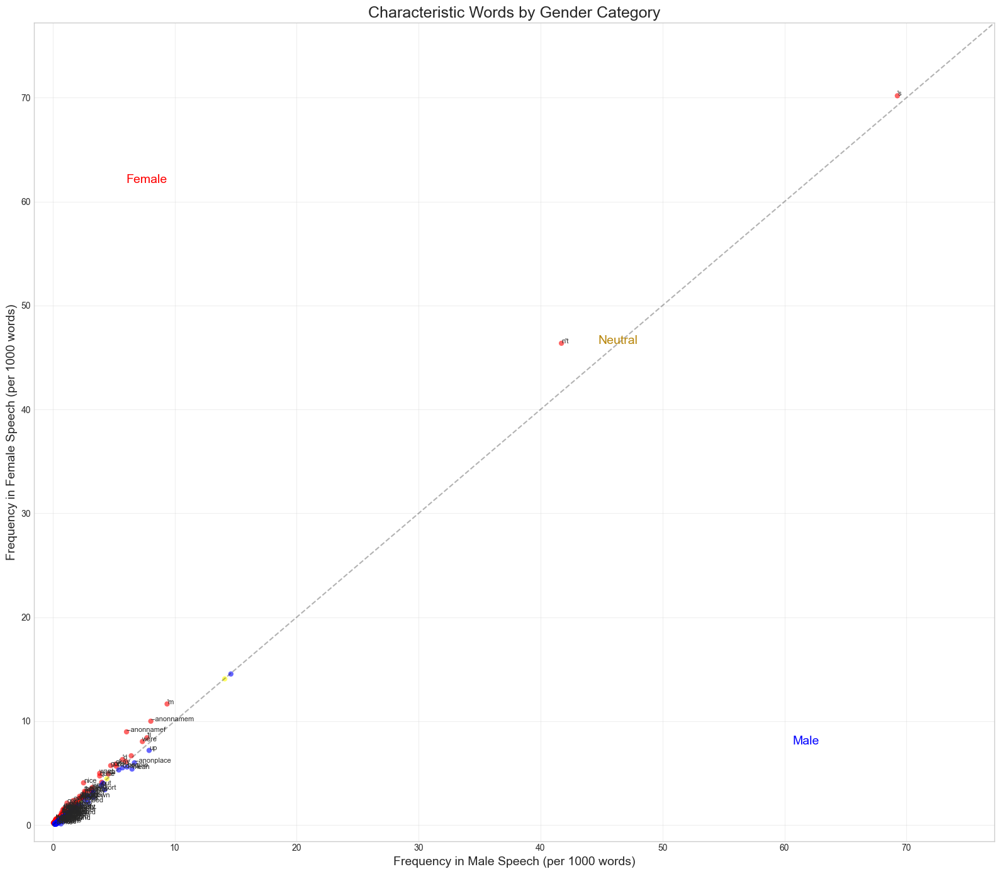

In [9]:
# Create scatter plot for gender comparison
def create_gender_scatter_plot(df, top_n=1000, min_diff=0.05, label_top=50):
    """Create a scatter plot of characteristic words by gender"""
    # Filter to top N most common words
    plot_data = df.nlargest(top_n, 'total_freq').copy()
    
    # Add color coding based on which gender uses the word more
    plot_data['color'] = 'yellow'  # Neutral (equal usage)
    plot_data.loc[plot_data['freq_diff'] > min_diff, 'color'] = 'red'  # Female-dominant
    plot_data.loc[plot_data['freq_diff'] < -min_diff, 'color'] = 'blue'  # Male-dominant
    
    # Create scatter plot
    plt.figure(figsize=(16, 14))
    
    # Plot all words with appropriate color
    for color in ['yellow', 'red', 'blue']:
        subset = plot_data[plot_data['color'] == color]
        plt.scatter(subset['male_freq'], subset['female_freq'], 
                   c=color, alpha=0.6, edgecolors='none')
    
    # Add reference line for equal usage
    max_freq = max(plot_data['male_freq'].max(), plot_data['female_freq'].max()) * 1.1
    plt.plot([0, max_freq], [0, max_freq], 'k--', alpha=0.3)
    
    # Label top characteristic words for each gender
    # Female-dominant words
    female_words = plot_data[plot_data['color'] == 'red'].nlargest(label_top, 'freq_diff')
    for idx, row in female_words.iterrows():
        plt.annotate(row['word'], 
                    (row['male_freq'], row['female_freq']),
                    fontsize=8)
    
    # Male-dominant words
    male_words = plot_data[plot_data['color'] == 'blue'].nsmallest(label_top, 'freq_diff')
    for idx, row in male_words.iterrows():
        plt.annotate(row['word'], 
                    (row['male_freq'], row['female_freq']),
                    fontsize=8)
    
    # Add labels and title
    plt.xlabel('Frequency in Male Speech (per 1000 words)', fontsize=14)
    plt.ylabel('Frequency in Female Speech (per 1000 words)', fontsize=14)
    plt.title('Characteristic Words by Gender Category', fontsize=18)
    
    # Add legend
    plt.text(max_freq*0.8, max_freq*0.1, 'Male', color='blue', fontsize=14, ha='center')
    plt.text(max_freq*0.1, max_freq*0.8, 'Female', color='red', fontsize=14, ha='center')
    plt.text(max_freq*0.6, max_freq*0.6, 'Neutral', color='darkgoldenrod', fontsize=14, ha='center')
    
    # Add some margins
    plt.xlim(-0.02*max_freq, max_freq)
    plt.ylim(-0.02*max_freq, max_freq)
    
    # Show reference lines
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('gender_characteristic_words.png', dpi=300)
    plt.show()
    
    return female_words, male_words

# Create the gender scatter plot
female_characteristic, male_characteristic = create_gender_scatter_plot(df_gender_freq)

## Word Frequency Analysis by Age Group

Now let's analyze word frequencies by age group (Young vs. Old) and create a scatter plot:

In [10]:
# Calculate word frequencies by age group
young_words = content_words[content_words['age_binary'] == 'Young']['word']
old_words = content_words[content_words['age_binary'] == 'Old']['word']

print(f"Young group words: {len(young_words)}")
print(f"Old group words: {len(old_words)}")

# Count word frequencies
young_word_counts = Counter(young_words)
old_word_counts = Counter(old_words)

# Calculate total words for normalization
young_total = sum(young_word_counts.values())
old_total = sum(old_word_counts.values())

print(f"Young total words: {young_total:,}")
print(f"Old total words: {old_total:,}")

Young group words: 1784252
Old group words: 2168475
Young total words: 1,784,252
Old total words: 2,168,475


In [11]:
# Create a word frequency comparison DataFrame for age
word_freq_age = []

# Set minimum frequency threshold to include a word (adjust as needed)
min_freq_threshold = 20

# Combine all words from both age groups
all_age_words = set()
for word, count in young_word_counts.items():
    if count >= min_freq_threshold:
        all_age_words.add(word)
        
for word, count in old_word_counts.items():
    if count >= min_freq_threshold:
        all_age_words.add(word)

# Calculate normalized frequencies
for word in all_age_words:
    young_freq = young_word_counts.get(word, 0) / young_total * 1000  # Per thousand words
    old_freq = old_word_counts.get(word, 0) / old_total * 1000  # Per thousand words
    
    # Only include words with sufficient frequency in at least one group
    if young_freq > 0 or old_freq > 0:
        word_freq_age.append({
            'word': word,
            'young_freq': young_freq,
            'old_freq': old_freq,
            'freq_ratio': (young_freq / old_freq) if old_freq > 0 else float('inf'),
            'freq_diff': young_freq - old_freq,
            'total_freq': young_freq + old_freq
        })

# Convert to DataFrame
df_age_freq = pd.DataFrame(word_freq_age)

# Sort by total frequency to find most common words
df_age_freq = df_age_freq.sort_values('total_freq', ascending=False)

print(f"Total unique words analyzed: {len(df_age_freq)}")
print("\nMost common words overall:")
print(df_age_freq.head(10))

Total unique words analyzed: 7611

Most common words overall:
             word  young_freq   old_freq  freq_ratio  freq_diff  total_freq
6459           's   71.656918  68.305606    1.049063   3.351312  139.962525
5568          n't   42.648684  46.238947    0.922354  -3.590263   88.887631
7051          're   14.272648  14.770749    0.966278  -0.498101   29.043397
1490          've   12.932030  15.005937    0.861794  -2.073908   27.937967
1325           'm   13.328274   8.615271    1.547052   4.713003   21.943545
4274  --anonnamem    8.267890  10.062371    0.821664  -1.794481   18.330261
3103          'll    7.929373   8.286469    0.956906  -0.357095   16.215842
502   --anonnamef    7.517996   8.090939    0.929187  -0.572943   15.608936
396          were    7.272515   8.191010    0.887866  -0.918494   15.463525
898            up    6.613416   8.150889    0.811373  -1.537474   14.764305


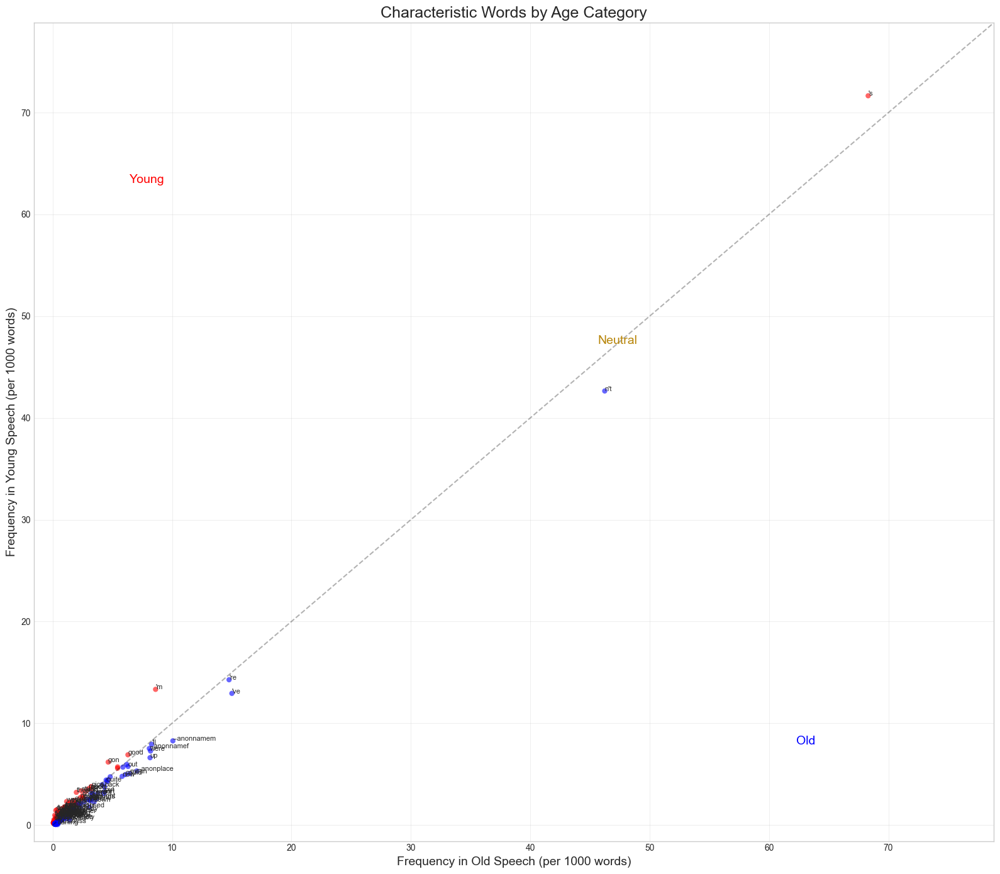

In [12]:
# Create scatter plot for age comparison
def create_age_scatter_plot(df, top_n=1000, min_diff=0.05, label_top=50):
    """Create a scatter plot of characteristic words by age"""
    # Filter to top N most common words
    plot_data = df.nlargest(top_n, 'total_freq').copy()
    
    # Add color coding based on which age group uses the word more
    plot_data['color'] = 'yellow'  # Neutral (equal usage)
    plot_data.loc[plot_data['freq_diff'] > min_diff, 'color'] = 'red'  # Young-dominant
    plot_data.loc[plot_data['freq_diff'] < -min_diff, 'color'] = 'blue'  # Old-dominant
    
    # Create scatter plot
    plt.figure(figsize=(16, 14))
    
    # Plot all words with appropriate color
    for color in ['yellow', 'red', 'blue']:
        subset = plot_data[plot_data['color'] == color]
        plt.scatter(subset['old_freq'], subset['young_freq'], 
                   c=color, alpha=0.6, edgecolors='none')
    
    # Add reference line for equal usage
    max_freq = max(plot_data['old_freq'].max(), plot_data['young_freq'].max()) * 1.1
    plt.plot([0, max_freq], [0, max_freq], 'k--', alpha=0.3)
    
    # Label top characteristic words for each age group
    # Young-dominant words
    young_words = plot_data[plot_data['color'] == 'red'].nlargest(label_top, 'freq_diff')
    for idx, row in young_words.iterrows():
        plt.annotate(row['word'], 
                    (row['old_freq'], row['young_freq']),
                    fontsize=8)
    
    # Old-dominant words
    old_words = plot_data[plot_data['color'] == 'blue'].nsmallest(label_top, 'freq_diff')
    for idx, row in old_words.iterrows():
        plt.annotate(row['word'], 
                    (row['old_freq'], row['young_freq']),
                    fontsize=8)
    
    # Add labels and title
    plt.xlabel('Frequency in Old Speech (per 1000 words)', fontsize=14)
    plt.ylabel('Frequency in Young Speech (per 1000 words)', fontsize=14)
    plt.title('Characteristic Words by Age Category', fontsize=18)
    
    # Add legend
    plt.text(max_freq*0.8, max_freq*0.1, 'Old', color='blue', fontsize=14, ha='center')
    plt.text(max_freq*0.1, max_freq*0.8, 'Young', color='red', fontsize=14, ha='center')
    plt.text(max_freq*0.6, max_freq*0.6, 'Neutral', color='darkgoldenrod', fontsize=14, ha='center')
    
    # Add some margins
    plt.xlim(-0.02*max_freq, max_freq)
    plt.ylim(-0.02*max_freq, max_freq)
    
    # Show reference lines
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('age_characteristic_words.png', dpi=300)
    plt.show()
    
    return young_words, old_words

# Create the age scatter plot
young_characteristic, old_characteristic = create_age_scatter_plot(df_age_freq)

## Display Top Characteristic Words

Let's display the top characteristic words for each demographic group:

In [13]:
# Print top characteristic words for gender groups
print("Top 20 Female-Characteristic Words:")
print(female_characteristic[['word', 'female_freq', 'male_freq', 'freq_diff']].head(20))

print("\nTop 20 Male-Characteristic Words:")
print(male_characteristic[['word', 'male_freq', 'female_freq', 'freq_diff']].head(20))

Top 20 Female-Characteristic Words:
             word  female_freq  male_freq  freq_diff
5526          n't    46.367926  41.710141   4.657784
500   --anonnamef     8.968448   6.049309   2.919140
1304           'm    11.652195   9.374866   2.277329
4242  --anonnamem     9.992386   8.040344   1.952042
4229         nice     4.058947   2.524453   1.534494
7097         want     4.971249   3.845297   1.125952
6415          gon     5.721209   4.751261   0.969949
5889          god     2.112893   1.169090   0.943803
6402           's    70.189600  69.257032   0.932568
3054        quite     4.721398   3.848554   0.872845
1724         okay     5.860242   5.164838   0.695404
389          were     8.034065   7.349311   0.684754
3071          'll     8.399640   7.723811   0.675829
277          even     2.353747   1.682969   0.670779
619          feel     1.563713   0.902707   0.661006
3391      thought     3.248875   2.605866   0.643009
5281         love     1.452895   0.817386   0.635509
1558      

In [14]:
# Print top characteristic words for age groups
print("Top 20 Young-Characteristic Words:")
print(young_characteristic[['word', 'young_freq', 'old_freq', 'freq_diff']].head(20))

print("\nTop 20 Old-Characteristic Words:")
print(old_characteristic[['word', 'old_freq', 'young_freq', 'freq_diff']].head(20))

Top 20 Young-Characteristic Words:
           word  young_freq   old_freq  freq_diff
1325         'm   13.328274   8.615271   4.713003
6459         's   71.656918  68.305606   3.351312
6475        gon    6.182423   4.646122   1.536300
6936     though    3.208627   1.979732   1.228895
1835       shit    1.431973   0.261013   1.170960
228     fucking    1.514921   0.355088   1.159832
5122        wan    2.303486   1.163490   1.139996
6343      stuff    3.359951   2.403532   0.956419
3529     pretty    1.615243   0.754908   0.860334
6173       cool    1.256549   0.402126   0.854423
2385        bad    1.808601   0.997936   0.810665
974       weird    1.368641   0.568602   0.800038
4324       fuck    0.955583   0.170627   0.784956
2538        mum    2.249122   1.479842   0.769280
5937        god    2.157206   1.401907   0.755300
5404  basically    1.250944   0.551079   0.699866
1585       fine    1.780018   1.080944   0.699074
622        feel    1.685861   0.998397   0.687463
6200  obviously

## Save Characteristic Word Lists

Save the lists of characteristic words to CSV files for further analysis:

In [15]:
# Save characteristic word lists to CSV files
female_characteristic[['word', 'female_freq', 'male_freq', 'freq_diff']].to_csv('female_characteristic_words.csv', index=False)
male_characteristic[['word', 'male_freq', 'female_freq', 'freq_diff']].to_csv('male_characteristic_words.csv', index=False)
young_characteristic[['word', 'young_freq', 'old_freq', 'freq_diff']].to_csv('young_characteristic_words.csv', index=False)
old_characteristic[['word', 'old_freq', 'young_freq', 'freq_diff']].to_csv('old_characteristic_words.csv', index=False)

print("Characteristic word lists saved to CSV files.")

Characteristic word lists saved to CSV files.


## Analysis Summary

This notebook has created scatter plot visualizations that show characteristic words by demographic groups in the BNC2014 corpus:

1. **Gender comparison (Female vs. Male)**: 
   - Words closer to the top-left are more characteristic of female speech
   - Words closer to the bottom-right are more characteristic of male speech
   - Words near the diagonal line are used with similar frequency by both genders

2. **Age comparison (Young vs. Old)**:
   - Words closer to the top-left are more characteristic of young speakers
   - Words closer to the bottom-right are more characteristic of older speakers
   - Words near the diagonal line are used with similar frequency by both age groups

The colored scatter plots allow visual identification of linguistic patterns across demographic groups, revealing interesting differences in vocabulary choices and linguistic preferences between demographic groups.

Key findings can include:
- Topic preferences (e.g., different content words may suggest different topics of interest)
- Differences in non-lexical vocalization usage (um, er, etc.)
- Use of intensifiers and hedges
- References to social contexts and relationships

## Interactive Visualization Using Scattertext

The [scattertext](https://github.com/JasonKessler/scattertext) library allows us to create more advanced, interactive visualizations of characteristic terms. Let's use it to visualize the differences between:
1. Female and Male speech patterns
2. Young and Old speaker language use

These interactive visualizations will allow us to explore the data more effectively.

In [16]:
# Import scattertext library
import scattertext as st
import spacy
import re
from sklearn.feature_extraction.text import TfidfTransformer
import pandas as pd
import numpy as np
from IPython.display import IFrame, HTML

# Load spaCy model
nlp = spacy.load('en_core_web_sm')

print("Libraries imported successfully")

C:\Users\jubal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Libraries imported successfully


In [17]:
# Prepare data for scattertext (Gender analysis)
# We need to create a corpus with documents by category

# First, let's aggregate utterances by speaker to create "documents"
print("Creating aggregated documents by speaker...")

# Get a list of speaker IDs with gender information
speakers_with_gender = df_words_with_demo[['speaker_id', 'gender']].drop_duplicates()
speakers_with_gender = speakers_with_gender.dropna()  # Remove speakers without gender info

# Initialize dictionaries to store documents
speaker_docs = {}
speaker_categories = {}

# Loop through speakers and aggregate their utterances
for _, row in speakers_with_gender.iterrows():
    speaker_id = row['speaker_id']
    gender = 'Female' if row['gender'] == 'F' else 'Male'
    
    # Get all words for this speaker
    words = df_words_with_demo[df_words_with_demo['speaker_id'] == speaker_id]['word'].tolist()
    
    # Join words into a document (use a max length to avoid processing issues)
    doc = ' '.join(words[:10000])  # Limit document size
    
    # Store document and category
    speaker_docs[speaker_id] = doc
    speaker_categories[speaker_id] = gender

# Create a DataFrame for scattertext
gender_df = pd.DataFrame({
    'speaker_id': list(speaker_docs.keys()),
    'text': list(speaker_docs.values()),
    'gender': [speaker_categories[speaker_id] for speaker_id in speaker_docs.keys()]
})

print(f"Created {len(gender_df)} speaker documents with gender labels")
print(f"Female speakers: {sum(gender_df['gender'] == 'Female')}")
print(f"Male speakers: {sum(gender_df['gender'] == 'Male')}")

Creating aggregated documents by speaker...
Created 671 speaker documents with gender labels
Female speakers: 365
Male speakers: 306


In [18]:
# Create a scattertext corpus for gender analysis
# This may take some time depending on the size of your data

# Function to clean and preprocess text
def clean_text(text):
    # Basic cleaning
    text = re.sub(r'\s+', ' ', text)  # Replace multiple spaces
    text = text.strip().lower()
    return text

# Clean the text data
gender_df['text_cleaned'] = gender_df['text'].apply(clean_text)

# Parse documents with spaCy for linguistic features
print("Parsing documents with spaCy (this may take a while)...")

# Process a smaller number of documents if needed
max_docs = 200  # Adjust based on your computer's capabilities
if len(gender_df) > max_docs:
    print(f"Limiting to {max_docs} documents for processing efficiency")
    # Ensure we have a balanced sample
    female_docs = gender_df[gender_df['gender'] == 'Female'].sample(min(max_docs//2, sum(gender_df['gender'] == 'Female')))
    male_docs = gender_df[gender_df['gender'] == 'Male'].sample(min(max_docs//2, sum(gender_df['gender'] == 'Male')))
    gender_df_sample = pd.concat([female_docs, male_docs])
else:
    gender_df_sample = gender_df

# Create corpus
corpus = st.CorpusFromPandas(
    gender_df_sample,
    category_col='gender',
    text_col='text_cleaned',
    nlp=nlp
).build()

print(f"Created scattertext corpus with {len(corpus.get_texts())} documents")

Parsing documents with spaCy (this may take a while)...
Limiting to 200 documents for processing efficiency
Created scattertext corpus with 200 documents
Created scattertext corpus with 200 documents


In [19]:
# Generate the scattertext visualization for gender comparison

# Create the visualization HTML
html = st.produce_scattertext_explorer(
    corpus,
    category='Female',
    category_name='Female',
    not_category_name='Male',
    width_in_pixels=1000,
    metadata=gender_df_sample['speaker_id'],
    term_scorer=st.RankDifference(),
    minimum_term_frequency=5,
    transform=st.Scalers.dense_rank,
    use_full_doc=True,
    pmi_threshold_coefficient=0,
    save_svg_button=True
)

# Save HTML to a file
with open('gender_scattertext.html', 'w', encoding='utf-8') as f:
    f.write(html)

print("Saved interactive gender visualization to 'gender_scattertext.html'")

# Display in notebook (may not work in all environments)
try:
    display(HTML(html))
except:
    print("HTML display not supported in this environment. Please open the saved HTML file manually.")

Saved interactive gender visualization to 'gender_scattertext.html'


In [20]:
# Prepare data for scattertext (Age analysis)
# Similar to gender analysis, but for age groups

# Get a list of speaker IDs with age information
speakers_with_age = df_words_with_demo[['speaker_id', 'age_binary']].drop_duplicates()
speakers_with_age = speakers_with_age.dropna()  # Remove speakers without age info

# Initialize dictionaries to store documents
speaker_docs_age = {}
speaker_age_categories = {}

# Loop through speakers and aggregate their utterances
for _, row in speakers_with_age.iterrows():
    speaker_id = row['speaker_id']
    age_group = row['age_binary']  # 'Young' or 'Old'
    
    # Get all words for this speaker
    words = df_words_with_demo[df_words_with_demo['speaker_id'] == speaker_id]['word'].tolist()
    
    # Join words into a document (use a max length to avoid processing issues)
    doc = ' '.join(words[:10000])  # Limit document size
    
    # Store document and category
    speaker_docs_age[speaker_id] = doc
    speaker_age_categories[speaker_id] = age_group

# Create a DataFrame for scattertext
age_df = pd.DataFrame({
    'speaker_id': list(speaker_docs_age.keys()),
    'text': list(speaker_docs_age.values()),
    'age_group': [speaker_age_categories[speaker_id] for speaker_id in speaker_docs_age.keys()]
})

print(f"Created {len(age_df)} speaker documents with age group labels")
print(f"Young speakers: {sum(age_df['age_group'] == 'Young')}")
print(f"Old speakers: {sum(age_df['age_group'] == 'Old')}")

Created 662 speaker documents with age group labels
Young speakers: 299
Old speakers: 363


In [5]:
# Create a scattertext corpus for age analysis
# Clean the text data
age_df['text_cleaned'] = age_df['text'].apply(clean_text)

# Process a smaller number of documents if needed
max_docs = 200  # Adjust based on your computer's capabilities
if len(age_df) > max_docs:
    print(f"Limiting to {max_docs} documents for processing efficiency")
    # Ensure we have a balanced sample
    young_docs = age_df[age_df['age_group'] == 'Young'].sample(min(max_docs//2, sum(age_df['age_group'] == 'Young')))
    old_docs = age_df[age_df['age_group'] == 'Old'].sample(min(max_docs//2, sum(age_df['age_group'] == 'Old')))
    age_df_sample = pd.concat([young_docs, old_docs])
else:
    age_df_sample = age_df

# Create corpus
age_corpus = st.CorpusFromPandas(
    age_df_sample,
    category_col='age_group',
    text_col='text_cleaned',
    nlp=nlp
).build()

print(f"Created scattertext corpus with {len(age_corpus.get_texts())} documents")

NameError: name 'age_df' is not defined

In [4]:
# Generate the scattertext visualization for age comparison

# Create the visualization HTML
age_html = st.produce_scattertext_explorer(
    age_corpus,
    category='Young',
    category_name='Young',
    not_category_name='Old',
    width_in_pixels=1000,
    metadata=age_df_sample['speaker_id'],
    term_scorer=st.RankDifference(),
    minimum_term_frequency=5,
    transform=st.Scalers.dense_rank,
    use_full_doc=True,
    pmi_threshold_coefficient=0,
    save_svg_button=True
)

# Save HTML to a file
with open('age_scattertext.html', 'w', encoding='utf-8') as f:
    f.write(age_html)

print("Saved interactive age visualization to 'age_scattertext.html'")

# Display in notebook (may not work in all environments)
try:
    display(HTML(age_html))
except:
    print("HTML display not supported in this environment. Please open the saved HTML file manually.")

NameError: name 'st' is not defined

## Compact Visualization: Characteristic Terms Plot

Let's also create a compact visualization that more closely resembles the example plots you shared. This visualization will highlight the most characteristic terms for each category in a more dense format.

In [3]:
# Create a more compact characteristic terms plot for gender comparison
# Similar to the example plots you shared

def create_compact_scattertext(corpus, category, not_category, 
                              term_scorer=st.ScaledFScore('female'),
                              title='Characteristic Terms',
                              filename='compact_viz.html'):
    """
    Create a compact visualization of characteristic terms
    """
    html = st.produce_characteristic_explorer(
        corpus,
        category=category,
        category_name=category,
        not_category_name=not_category,
        term_scorer=term_scorer,
        minimum_term_frequency=5,
        pmi_threshold_coefficient=0,
        width_in_pixels=1000,
        metadata=None,
        use_non_text_features=False,
        use_full_doc=True,
        characteristic_scorer=st.DenseRankCharacteristicness(),
        number_to_show=4000,
        word_vec_use_p_vals=True,
        max_p_val=0.05,
        p_value_colors=True,
        save_svg_button=True,
        x_label=f'Characteristic of {not_category}',
        y_label=f'Characteristic of {category}'
    )
    
    # Save HTML to a file
    with open(filename, 'w', encoding='utf-8') as f:
        f.write(html)
    
    print(f"Saved compact visualization to '{filename}'")
    
    # Display in notebook (may not work in all environments)
    try:
        display(HTML(html))
    except:
        print("HTML display not supported in this environment. Please open the saved HTML file manually.")

# Create gender visualization
print("Creating compact visualization for gender comparison...")
create_compact_scattertext(
    corpus,
    category='Female',
    not_category='Male',
    term_scorer=st.ScaledFScore('female'),
    title='Characteristic Terms by Gender',
    filename='gender_characteristic_compact.html'
)

NameError: name 'st' is not defined

In [2]:
# Create age visualization in compact format
print("Creating compact visualization for age comparison...")
create_compact_scattertext(
    age_corpus,
    category='Young',
    not_category='Old',
    term_scorer=st.ScaledFScore('young'),
    title='Characteristic Terms by Age Group',
    filename='age_characteristic_compact.html'
)

Creating compact visualization for age comparison...


NameError: name 'create_compact_scattertext' is not defined

## Exporting Static Versions of Visualizations

If you need static images for a report or presentation, you can save the visualizations as PNG files. Here's how to do it:

1. Open the HTML files in a browser
2. Use the "Save SVG" button in the visualization
3. Convert the SVG to PNG using an image editor or online converter

Alternatively, you can take screenshots of the most informative sections of the visualizations.

The static visualizations will show the same word patterns but without the interactive features. The advantage of the interactive HTML versions is that you can:

- Hover over any term to see exact frequency information
- Search for specific terms of interest
- Adjust the visualization settings in real-time
- See terms in context by clicking on them

These visualizations provide much richer information than traditional scatter plots, making them ideal for linguistic analysis.

## Topic-Based Analysis with Empath Categories

Scattertext also allows us to analyze the data using Empath categories, which provide insights into different topics and themes present in the text. This can help identify broader patterns of language use beyond individual words.

In [1]:
# Try using Empath categories for a topic-based analysis
# This method might require additional setup if the empath_local module is not available

try:
    # Create a topic-based visualization for gender
    topic_viz = st.produce_scattertext_explorer(
        corpus,
        category='Female',
        category_name='Female',
        not_category_name='Male',
        width_in_pixels=1000,
        use_non_text_features=True,
        use_full_doc=True,
        topic_model_term_lists=st.get_empath_topics(),
        topic_model_preview_size=20,
        metadata=gender_df_sample['speaker_id'],
        show_diagonal=False
    )
    
    # Save HTML to a file
    with open('gender_topics.html', 'w', encoding='utf-8') as f:
        f.write(topic_viz)
    
    print("Saved topic-based visualization to 'gender_topics.html'")
    
    # Display in notebook
    try:
        display(HTML(topic_viz))
    except:
        print("HTML display not supported in this environment. Please open the saved HTML file manually.")
        
except Exception as e:
    print(f"Could not create topic-based visualization: {e}")
    print("This feature may require additional setup or packages.")

Could not create topic-based visualization: name 'st' is not defined
This feature may require additional setup or packages.


## Interpreting the Scattertext Visualizations

The scattertext visualizations offer several key insights into language patterns across demographic groups:

### In Gender-Based Analysis:
1. **Female-characteristic terms** (appearing toward the upper left):
   - These words are used significantly more by female speakers
   - Size indicates overall frequency in the corpus
   - Words closest to the top-left are the most distinctively "female"

2. **Male-characteristic terms** (appearing toward the bottom right):
   - These words are used significantly more by male speakers
   - Words closest to the bottom-right are the most distinctively "male"

3. **Neutral terms** (appearing near the diagonal):
   - These words are used with similar frequency by both groups
   - Size still indicates overall frequency

### In Age-Based Analysis:
1. **Young-characteristic terms** (upper left): Words distinctively used by younger speakers
2. **Old-characteristic terms** (bottom right): Words distinctively used by older speakers
3. **Neutral terms** (along diagonal): Words used similarly by both age groups

### Analytical Value:
- These visualizations highlight distinctive vocabulary choices
- They reveal subtle patterns that might not be apparent in traditional analysis
- The interactive nature allows for deep exploration of specific words and contexts
- The compact visualization resembles the format you shared in your examples

The HTML files provide permanent records of these visualizations that can be shared, explored, and referenced for your analysis.

In [ ]:
# Extract top characteristic terms for each category for use in your analysis
# This gives you lists of the most characteristic terms for each demographic group

def get_characteristic_terms(corpus, category, not_category, num_terms=50):
    """Extract the most characteristic terms for each category"""
    term_freq_df = corpus.get_term_freq_df()
    term_freq_df.columns = ['term', category, not_category, 'corpus']
    
    # Calculate term frequencies per category
    term_freq_df[f'{category}_freq'] = term_freq_df[category] / term_freq_df[category].sum()
    term_freq_df[f'{not_category}_freq'] = term_freq_df[not_category] / term_freq_df[not_category].sum()
    
    # Calculate frequency difference
    term_freq_df['diff'] = term_freq_df[f'{category}_freq'] - term_freq_df[f'{not_category}_freq']
    
    # Get top terms for first category
    category_terms = term_freq_df.sort_values('diff', ascending=False).head(num_terms)
    
    # Get top terms for second category
    not_category_terms = term_freq_df.sort_values('diff', ascending=True).head(num_terms)
    
    return category_terms, not_category_terms

# Get characteristic terms for gender
try:
    female_terms, male_terms = get_characteristic_terms(corpus, 'Female', 'Male')
    
    print("Top 20 Female-Characteristic Terms:")
    print(female_terms[['term', 'Female_freq', 'Male_freq', 'diff']].head(20))
    
    print("\nTop 20 Male-Characteristic Terms:")
    print(male_terms[['term', 'Male_freq', 'Female_freq', 'diff']].head(20))
    
    # Save to CSV for later reference
    female_terms.to_csv('female_characteristic_scattertext.csv', index=False)
    male_terms.to_csv('male_characteristic_scattertext.csv', index=False)
    
except Exception as e:
    print(f"Could not extract characteristic terms: {e}")

# Get characteristic terms for age
try:
    young_terms, old_terms = get_characteristic_terms(age_corpus, 'Young', 'Old')
    
    print("\nTop 20 Young-Characteristic Terms:")
    print(young_terms[['term', 'Young_freq', 'Old_freq', 'diff']].head(20))
    
    print("\nTop 20 Old-Characteristic Terms:")
    print(old_terms[['term', 'Old_freq', 'Young_freq', 'diff']].head(20))
    
    # Save to CSV for later reference
    young_terms.to_csv('young_characteristic_scattertext.csv', index=False)
    old_terms.to_csv('old_characteristic_scattertext.csv', index=False)
    
except Exception as e:
    print(f"Could not extract characteristic terms for age groups: {e}")

## Comparison with Traditional Visualizations

The scattertext visualizations provide several advantages over the traditional scatter plots we created earlier:

1. **Interactive exploration** - Users can hover and click on terms for more information
2. **Higher density** - Can display thousands of terms at once
3. **Better context** - Shows relative frequency and distinctiveness simultaneously
4. **Topic categorization** - Can group terms by semantic topics (with the Empath feature)
5. **Statistical significance** - Can highlight terms with statistically significant differences

For your BNC2014 British National Corpus analysis, these visualizations offer a more comprehensive view of linguistic differences between demographic groups, making patterns more apparent and interpretable.

These tools can be especially valuable when presenting your findings, as they allow the audience to explore the data themselves rather than relying solely on static visualizations or selected examples.